In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.autograd import Variable
from torch import autograd
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from PIL import Image

In [2]:
grade =2

dataroot = f"../processed/{grade}/test/"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 128

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 128

# Size of feature maps in generator
ngf = 32

# Size of feature maps in discriminator
ndf = 32

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

In [3]:
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

In [4]:
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [9]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(nz, ngf * 32, 2, 1, 0, bias=False), 
            nn.BatchNorm2d(ngf * 32),
            nn.ReLU(True), #in-place option = True?
            
            
            nn.ConvTranspose2d(ngf*32, ngf*16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*16),
            nn.ReLU(True),
            
            # state size. (ngf*16) x 2 x 2
            
            
            nn.ConvTranspose2d(ngf*16, ngf*8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(128, 1024, kernel_size=(2, 2), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): BatchN

In [10]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False), 
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, ndf * 16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 16),
            nn.LeakyReLU(0.2, inplace=True),
            
            
            nn.Conv2d(ndf * 16, 1, 4, 1, 0, bias=False), 
            #nn.Sigmoid() #sigmoid[0, 1]
        )

    def forward(self, input):
        return self.main(input) #feedforward


# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))
    
# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)


Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (12): BatchNorm2d(512, eps=1e-05, mom

In [11]:
def compute_gradient_penalty(real_images, fake_images):
    B_size = real_images.size(0)
 
    eta = torch.FloatTensor(B_size,1,1,1).uniform_(0,1).to(device) #(batch_size, 1, 1, 1)
    eta = eta.expand(B_size, real_images.size(1), real_images.size(2), real_images.size(3)) #expand (batch_size, 1, 1, 1) -> (batch_size, real_images.size(1), real_images.size(2), real_images.size(3))
    
    interpolated = eta * real_images + ((1 - eta) * fake_images) 
    interpolated = torch.tensor(interpolated, requires_grad=True) 
    prob_interpolated = netD(interpolated)
    gradients = autograd.grad(outputs=prob_interpolated, #output prob_interpolated, input interpolated
                            inputs=interpolated,
                            grad_outputs=torch.ones(prob_interpolated.size()).to(device),
                            create_graph=True,
                            retain_graph=True)[0] 
    grad_penalty = ((gradients.norm(2, dim=(1,2,3)) - 1) ** 2).mean() 
    return grad_penalty

In [12]:
# Number of training epochs
num_epochs = 500

# Number of generator iterations
g_iters = 2

# Parameter for the gradient penalty
lambda_gp = 10 
# Initialize BCELoss function
#criterion = nn.BCELoss() #binary cross entropy(-ylogx - (1-y)log(1-x))

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(128, nz, 1, 1, device=device) #latent space vector

# Establish convention for real and fake labels during training 
real_label = 1. 
fake_label = 0. 

# Setup Adam optimizers for both G and D
lrD = 0.0002
lrG = 0.00022
optimizerD = optim.Adam(netD.parameters(), lr=lrD, betas=(beta1, 0.999)) 
optimizerG = optim.Adam(netG.parameters(), lr=lrG, betas=(beta1, 0.999)) 

In [13]:
netG = Generator(1)
netD = Discriminator(1)

inputG = torch.randn(batch_size, nz, 1, 1)
inputD = torch.randn(batch_size, nc, 128, 128)
#print(netG)
#print(netD)
print("\nOutputs size:")
print(netG(inputG).size())
print(netD(inputD).size())
netG = Generator(ngpu).to(device) 
netD = Discriminator(ngpu).to(device)


Outputs size:
torch.Size([128, 3, 128, 128])
torch.Size([128, 1, 1, 1])


In [14]:
noise = torch.randn(128, nz, 1, 1, device=device)

In [ ]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
  # For each batch in the dataloader
  for i, data in enumerate(dataloader, 0): #enumerate(dataloader, 0)
    ############################
    # (1) Update D network: minimize -E(D(x)) + E(D(G(z))) + lambda_gp*E(|grad(D(y)) - 1|^2)
    ###########################
    ## Train with all-real batch
    netD.zero_grad()
    # Format batch
    real_cpu = data[0].to(device) #data[0] mini batch
    b_size = real_cpu.size(0) #minibatch
    #print(b_size)
    # Forward pass real batch through D
    Dreal = netD(real_cpu).view(-1) 
    # Generate batch of latent vectors
    noise = torch.randn(b_size, nz, 1, 1, device=device) #(b_size, nz, 1, 1)
    # Generate fake image batch with G
    fake = netG(noise) 
    # Calculate the critic for all fake batch
    Dfake = netD(fake.clone().detach()).view(-1) 
    # Calculate loss on all batch
    errD = -Dreal.mean() + Dfake.mean() + lambda_gp * compute_gradient_penalty(real_images=real_cpu, fake_images=fake) #gradient penalty loss function
    #print(errD)
    errD.backward() 
    D_x = Dreal.mean().item() #D(real data)
    D_G_z1 = Dfake.mean().item() 
    # Update D
    optimizerD.step()
    netG.zero_grad() 
    ############################
    # (2) Update G network: minimize -E(C(G(z)))
    ###########################
    for j in range(g_iters):
        netG.zero_grad()
        fake = netG(noise) 
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1) #D(G(z))
        #print(output)
        # Calculate G's loss based on this output
        errG = -output.mean()
        #errG = -output.mean()
        
        #print(errG)
        # Calculate gradients for G
        errG.backward() 
        D_G_z2 = output.mean().item() 
        # Update G
        optimizerG.step() 



    # Output training stats
    if i % 50 == 0:
        print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
              % (epoch, num_epochs, i, len(dataloader),
                  errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
        #print('{}'.format(datetime.datetime.now()))
    
    # Save Losses for plotting later
    G_losses.append(errG.item())
    D_losses.append(errD.item())
    
    # Check how the generator is doing by saving G's output on fixed_noise
    if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
        with torch.no_grad():
            fake = netG(fixed_noise).clone().detach().cpu()
        img_list.append(vutils.make_grid(fake, padding=0, normalize=True))
        
    iters += 1

Starting Training Loop...


<ipython-input-11-4588b6819220>:8: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  interpolated = torch.tensor(interpolated, requires_grad=True)


[0/500][0/9]	Loss_D: 11.7434	Loss_G: 0.1009	D(x): 0.1027	D(G(z)): -0.1009 / -0.1009


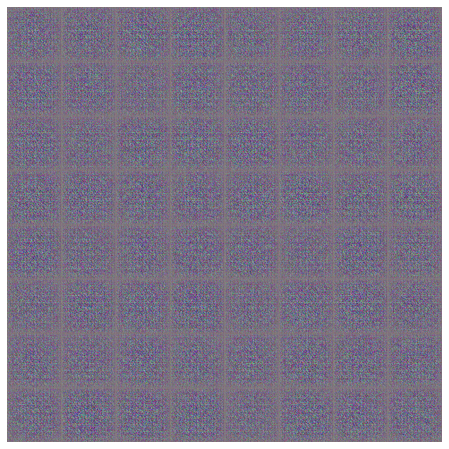

In [16]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [60]:
img_list[-1].shape

torch.Size([3, 512, 512])

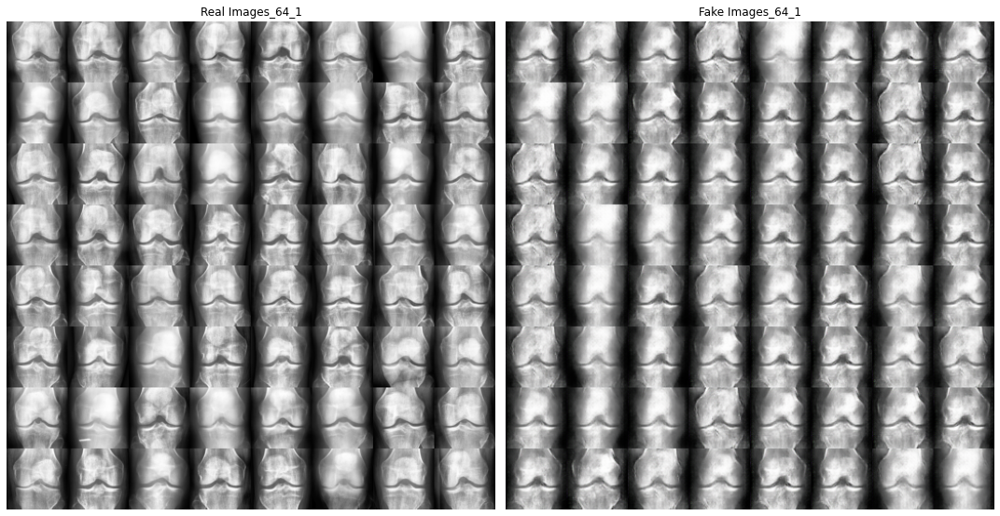

In [12]:
# Grab a batch of real images from the dataloader
exp_date = "0128"

real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title(f"Real Images_{image_size}_{grade}")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=0, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title(f"Fake Images_{image_size}_{grade}")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))

plt.tight_layout()
plt.savefig(f'WGAN_image_knee_after{num_epochs}epoches{image_size}{grade}{exp_date}.png')
plt.show()


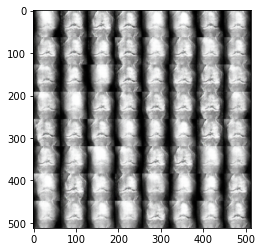

In [80]:
img_fake= img_list[-1]
img_fake= np.transpose(img_fake,(1,2,0))
plt.imshow(img_fake)

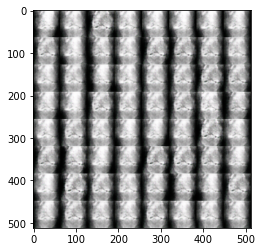

0 0
0 1
0 2
0 3
0 4
0 5
0 6
0 7
1 0
1 1
1 2
1 3
1 4
1 5
1 6
1 7
2 0
2 1
2 2
2 3
2 4
2 5
2 6
2 7
3 0
3 1
3 2
3 3
3 4
3 5
3 6
3 7
4 0
4 1
4 2
4 3
4 4
4 5
4 6
4 7
5 0
5 1
5 2
5 3
5 4
5 5
5 6
5 7
6 0
6 1
6 2
6 3
6 4
6 5
6 6
6 7
7 0
7 1
7 2
7 3
7 4
7 5
7 6
7 7


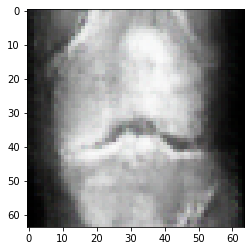

In [81]:
exp_date = "0128"

torch.save(netG, f'../model/GEN_{num_epochs}_{grade}{exp_date}.pth') 
torch.save(netD, f'../model/Dis_{num_epochs}_{grade}{exp_date}.pth')

arr = np.asarray(img_fake)
arr = np.split(arr, 8)
arr = np.array([np.split(x, 8, 1) for x in arr])
import scipy.misc
from PIL import Image
n=1
import matplotlib

for i in range(8):
    for j in range(8):
        print(i,j)
        img_array= arr[i][j]
        #print(img_array.shape)
        #im = Image.fromarray(img_array)
        plt.imshow(img_array)
        matplotlib.image.imsave(f'../Proc_result/{grade}/{exp_date}fake_image{n}.png', img_array)

        #im.save(f'./Proc_result/{grade}/fake_image{n}.png')
        
        #im = Image.fromarray(img_array)
        #im.save(f'./result/fake_image{n}.png')
        n +=1 